In [1]:
# Step 1: Downlaod the dependencies

# numpy for mathematical operations and matrices and vectors
import numpy as np 
# pandas is for dataframes and to manipulate the data
import pandas as pd 
# matplotlib is to visualize graphs and the data
import matplotlib.pyplot as plt
# seaborn is advanced visualization library
import seaborn as sns
# pandas_datareader is to read data from the Web
import pandas_datareader as web
# datetime is library to manipulate date and time 
import datetime as dt
# calendar to show the dates
import calendar
# accessing directory structure
import os 
# plotly is to visualize data and interact with the plot  
import plotly
# cufflinks connects plotly with pandas 
import cufflinks as cf
# we are using plotly as an open source and offline so we have to import potly.offline
from plotly.offline import download_plotlyjs, init_notebook_mode,plot,iplot
# connect the javascript to my notebook(connects pandas and python into interactive javascript library)
init_notebook_mode(connected=True) 
# allows cufflinks to go offline 
cf.go_offline()
# remove warning messages 
import warnings 
warnings.filterwarnings('ignore')
# rcParams['patch.force_edgecolor']=True is to give edges to the plot to make it more appealing
plt.rcParams['patch.force_edgecolor']=True
# darkgrid is to set the grid of the plot to black
sns.set_style('darkgrid')
# plt.grid(True) is to show the grid 
plt.grid(True)
# to show the graphs in Jupyter notebook
%matplotlib inline

C:\Users\jamil\Anaconda3\lib\site-packages\requests\__init__.py:80: RequestsDependencyWarning: urllib3 (1.25.3) or chardet (3.0.4) doesn't match a supported version!
  RequestsDependencyWarning)


In [ ]:
# read the Energy datasets frame from PJMW_hourly_unmodified (the dataset date is form 2002 April-2016 December)
# call it energy_frame
energy_frame=pd.read_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\PJMW_hourly_unmodified.csv")
# splitting the Hour_End column to Datae and Time 
energy_frame['Date']=energy_frame['Hour_End'].apply(lambda j: j.split()[0])
energy_frame['Time']=energy_frame['Hour_End'].apply(lambda j: j.split()[1])
energy_frame['Time_Rank']=energy_frame['Time'].apply(lambda j: int(j.split(':')[0]))
# group by Date column and call it temp_frame_1
temp_frame_1=energy_frame.groupby('Date')
# take the first goupby Date DataFrame and call it temp_frame_2
temp_frame_2=temp_frame_1.get_group('2002-04-01')
# sort temp_frame_2 based on the Time_Rank column 
temp_frame_2.sort_values('Time_Rank',ascending=True,inplace=True)
# get temp_frame_2 keys 
temp_frame_2_keys=list(temp_frame_1.groups.keys())
# make a for loop to loop through all the keyss and sort them based on the Time_Rank column and concatenate them
for j in temp_frame_2_keys[1:-1]:
    sub_frame=temp_frame_1.get_group(j)
    sub_frame.sort_values('Time_Rank',ascending=True,inplace=True)
    temp_frame_2=pd.concat([temp_frame_2,sub_frame],axis=0)
# set the Hour_End column as an index 
temp_frame_2.set_index(temp_frame_2['Hour_End'],inplace=True)
# drop Hour_End/Time/Date/Time_Rank columns 
temp_frame_2.drop(labels='Hour_End',axis=1,inplace=True)
temp_frame_2.drop(labels='Time',axis=1,inplace=True)
temp_frame_2.drop(labels='Date',axis=1,inplace=True)
temp_frame_2.drop(labels='Time_Rank',axis=1,inplace=True)
# save the temp_frame_2 to PJMW_hourly_modified.csv
temp_frame_2.to_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\PJMW_hourly_modified.csv")
# print out temp_frame_2
print(temp_frame_2)

In [ ]:
# read the file 2002-2016_ERCOT_Hourly_Load_Data.csv and call it df_1
df_1=pd.read_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\PJMW_hourly_modified.csv")
# making the Hour_End column as an index for df_1
df_1.set_index(df_1['Hour_End'],inplace=True)
# split df_1 to train and test set 
energy_frame_train=df_1.loc['2002-04-01 1:00':'2014-12-31 23:00']
energy_frame_test=df_1.loc['2015-01-01 0:00':'2016-12-31 23:00']
# making the Hour_End column as an index for energy_frame_train
energy_frame_train.set_index(energy_frame_train['Hour_End'],inplace=True)
# removing the Hour_End column
energy_frame_train.drop(labels='Hour_End',axis=1,inplace=True)
# making the Hour_End column as an index for weather_frame_test
energy_frame_test.set_index(energy_frame_test['Hour_End'],inplace=True)
# removing the Hour_End column
energy_frame_test.drop(labels='Hour_End',axis=1,inplace=True)
# show train and test set for energy_frame
print(energy_frame_train)
print(energy_frame_test)
# save the train and test set of the energy_frame 
energy_frame_train.to_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\energy_frame_train.csv")
energy_frame_test.to_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\energy_frame_test.csv")

In [ ]:
# read the weather datasets frame for year 2002 and call it weather_frame
weather_frame=pd.read_csv('C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\2002_ERCOT_Hourly_Load_Data.csv')
# making the Hour_End column as an index for the dataset
weather_frame.set_index(weather_frame['Hour_End'],inplace=True)
# removing the Hour_End column
weather_frame.drop(labels='Hour_End',axis=1,inplace=True)
# show weather_frame after the above modifications 
weather_frame

In [ ]:
# making for loop to read the Weather files between 2003-2016
for i in range(3,17):
#   assigning x to string of i so we can concatenate it to the file path
    x=str(i)
    if int(x)<10:
#       if integer of x is less than 10 then we add 0 becuase we concatenate 20+x so to make it eg. 2004 we make x='4' to x='04'
#       '20' + x will be '2004' valid year if integer of x is less than 10 then we don't change it eg. 2014 we make x='14'
#       so '20' + x will be '2014' valid year
        x='0'+x
# read the file for the sepcified year in x and call it sub_frame
    sub_frame=pd.read_csv('20'+x+'_ERCOT_Hourly_Load_Data.csv')
#   making the Date column as an index for the dataset
    sub_frame.set_index(sub_frame['Hour_End'],inplace=True)
#   removing the Hour_End column
    sub_frame.drop(labels='Hour_End',axis=1,inplace=True)
#   For eache loop we concatenate the Weather_Frame to the Sub_Frame on the Date index so we get a full Data set
#   between 2002-2016
    weather_frame=pd.concat([weather_frame,sub_frame],axis=0)

In [ ]:
# print statement 
print("This is the Weather Frame")
# save the weather_frame to 2002-2016_ERCOT_Hourly_Load_Data.csv
weather_frame.to_csv('C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\2002-2016_ERCOT_Hourly_Load_Data.csv')
# show the weather_frame
print(weather_frame)

In [ ]:
# read the file 2002-2016_ERCOT_Hourly_Load_Data.csv and call it df_2
df_2=pd.read_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\2002-2016_ERCOT_Hourly_Load_Data.csv")
# making the Hour_End column as an index for df_2
df_2.set_index(df_2['Hour_End'],inplace=True)
# split df_2 to train and test set
weather_frame_train=df_2.loc['2002-04-01 1:00':'2014-12-31 23:00']
weather_frame_test=df_2.loc['2015-01-01 0:00':]
# making the Hour_End column as an index for weather_frame_train
weather_frame_train.set_index(weather_frame_train['Hour_End'],inplace=True)
# removing the Hour_End column
weather_frame_train.drop(labels='Hour_End',axis=1,inplace=True)
# making the Hour_End column as an index for weather_frame_test
weather_frame_test.set_index(weather_frame_test['Hour_End'],inplace=True)
# removing the Hour_End column
weather_frame_test.drop(labels='Hour_End',axis=1,inplace=True)
# show train and test set for weather_frame
print(weather_frame_train)
print(weather_frame_test)
# save the train and test sets for weather_frame
weather_frame_train.to_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\weather_frame_train.csv")
weather_frame_test.to_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\weather_frame_test.csv")

In [ ]:
# read the file weather_frame_train/weather_frame_test/energy_frame_train/energy_frame_test
df_3=pd.read_csv('C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\weather_frame_train.csv')
df_4=pd.read_csv('C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\weather_frame_test.csv')
df_5=pd.read_csv('C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\energy_frame_train.csv')
df_6=pd.read_csv('C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\energy_frame_test.csv')
# concat energy and weather frame for both test and train
weather_energy_frame_train=pd.merge(df_3,df_5,how='inner',on=['Hour_End'])
weather_energy_frame_test=pd.merge(df_4,df_6,how='inner',on=['Hour_End'])
# making the Hour_End column as an index for weather_energy_frame_train/weather_energy_frame_test
weather_energy_frame_train.set_index(weather_energy_frame_train['Hour_End'],inplace=True)
weather_energy_frame_test.set_index(weather_energy_frame_test['Hour_End'],inplace=True)
# removing the Hour_End column for weather_energy_frame_train/weather_energy_frame_test
weather_energy_frame_train.drop(labels='Hour_End',axis=1,inplace=True)
weather_energy_frame_test.drop(labels='Hour_End',axis=1,inplace=True)
# show weather_energy_frame_train and weather_energy_frame_test
print(weather_energy_frame_train)
print(weather_energy_frame_test)
# save the train and test sets for weather_energy_frame
weather_energy_frame_train.to_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\weather_energy_frame_train.csv")
weather_energy_frame_test.to_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\weather_energy_frame_test.csv")

In [ ]:
energy_frame_train=pd.read_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\energy_frame_train.csv")
energy_frame_train['PJMW_MW'].plot.hist(figsize=(15,5),bins=200, title="test graph") 

In [ ]:
energy_frame_train.plot(figsize=(15,5),style='*',title="Jojo El motw7esh",kind='kde')

In [ ]:
weather_frame_train=pd.read_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\weather_frame_train.csv",index_col=[0])
weather_frame_train['ERCOT'].plot(figsize=(15,10),style='.')

In [ ]:
# make a function to give the dataset a features 
def dataset_add_features(x):
    '''
    This is a function to add features to the dataset such as year/month/day/day of week/hour columns 
    
    Parameters:
        x (Panda Frame): the dataset you want to add the features to
        
    Returns:
        y (Panda Frame): the dataset with features added 
    '''
    
    y=x.copy()
    y['DateTime']=y.index
    y['DateTime'] = pd.to_datetime(y['DateTime'])
    y['Year']=y['DateTime'].apply(lambda j : j.year)
    y['Month']=y['DateTime'].apply(lambda j : j.month)
    y['Day']=y['DateTime'].apply(lambda j : j.day)
    y['Hour']=y['DateTime'].apply(lambda j : j.hour)
    y['DayOfWeek']=y['DateTime'].apply(lambda j: calendar.day_name[j.weekday()])
    y.drop(labels='DateTime',axis=1,inplace=True)
    
    return y

    
        

In [ ]:
# using the feature function and show the results after applying it 
weather_frame_train_features=dataset_add_features(weather_frame_train)
print(weather_frame_train_features)

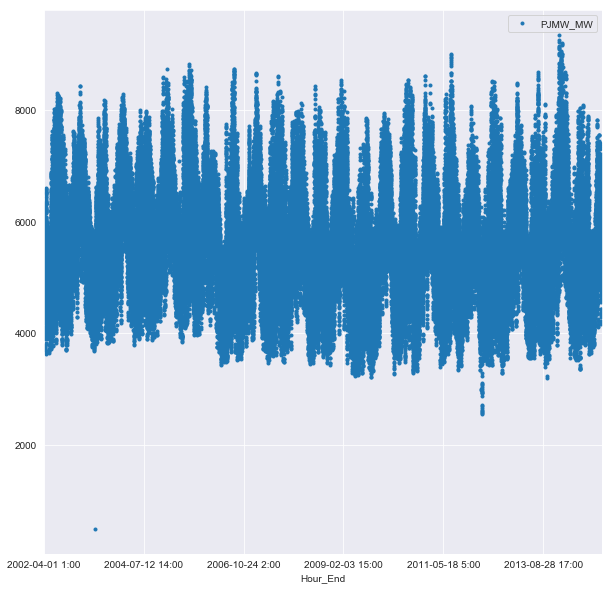

In [4]:
energy_frame_train=pd.read_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\energy_frame_train.csv",index_col=[0])
energy_frame_train.plot(figsize=(10,10),style='.')

In [ ]:
energy_frame_train_features=dataset_add_features(energy_frame_train)
sns.pairplot(energy_frame_train_features,hue='Hour',
             x_vars=['Hour','DayOfWeek','Year','Month'],
             y_vars='PJMW_MW',
             height=5,
             plot_kws={'alpha':0.1, 'linewidth':0})

In [ ]:
dataparser=lambda j: dt.datetime.strptime(j,"%Y-%m-%d %H:%M")
energy_frame_train=pd.read_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\energy_frame_train.csv",index_col=0,
                               parse_dates=['Hour_End'],date_parser=dataparser)
print(energy_frame_train.info())
energy_frame_train.head()

In [ ]:
for i in range (2,15):
    x=str(i)
    if int(x)<10:
        x='0'+x
    if i==2:
        energy_frame_train.loc['20'+x+'-4-1':'20'+x+'-12-31'].rolling(24*30).mean().plot(figsize=(20,3),linewidth=5,fontsize=20)
    else:
        energy_frame_train.loc['20'+x+'-1-1':'20'+x+'-12-31'].rolling(24*30).mean().plot(figsize=(20,3),linewidth=5,fontsize=20)
    plt.title('Power plot for year '+'20'+x, fontsize=20);
    plt.xlabel('Month', fontsize=20);
    plt.ylabel('Power MW', fontsize=17);
    plt.tight_layout()

In [24]:
months={'1':"January","2":"February","3":"March","4":"April","5":"May","6":"June","7":"July","8":"August","9":"September",
        "10":"October","11":"November","12":"December",}

In [ ]:
for i in range (2,15):
    x=str(i)
    if int(x)<10:
        x='0'+x
    if i==2:
        for j in range(4,13):
            y=str(j)
            if j==12:
                energy_frame_train.loc['20'+x+'-'+str(j)+'-1':'20'+x+'-'+str(j)+'-31'].diff().plot(figsize=(20,5),linewidth=5,fontsize=20)
                plt.title('Power plot for year '+'20'+x+" at "+months[y], fontsize=20);
                plt.xlabel('Month', fontsize=20);
                plt.ylabel('Power MW', fontsize=17);
                plt.tight_layout()
            else:
                energy_frame_train.loc['20'+x+'-'+str(j)+'-1':'20'+x+'-'+str(j+1)+'-1'].diff().plot(figsize=(20,5),linewidth=5,fontsize=20)
                plt.title('Power plot for year '+'20'+x+" at "+months[y], fontsize=20);
                plt.xlabel('Month', fontsize=20);
                plt.ylabel('Power MW', fontsize=17);
                plt.tight_layout()    
    else:
        for k in range(1,13):
            z=str(k)
            if k==12:
                energy_frame_train.loc['20'+x+'-'+str(k)+'-1':'20'+x+'-'+str(k)+'-31'].diff().plot(figsize=(20,5),linewidth=5,fontsize=20)
                plt.title('Power plot for year '+'20'+x+" at "+months[z], fontsize=20);
                plt.xlabel('Month', fontsize=20);
                plt.ylabel('Power MW', fontsize=17);
                plt.tight_layout()
            else:
                energy_frame_train.loc['20'+x+'-'+str(k)+'-1':'20'+x+'-'+str(k+1)+'-1'].diff().plot(figsize=(20,5),linewidth=5,fontsize=20)
                plt.title('Power plot for year '+'20'+x+" at "+months[z], fontsize=20);
                plt.xlabel('Month', fontsize=20);
                plt.ylabel('Power MW', fontsize=17);
                plt.tight_layout()  
       

In [ ]:
import statsmodels.api as sm
y = energy_frame_train['PJMW_MW'].resample('MS').mean()
y.plot(figsize=(15, 6))
plt.xlabel('Year', fontsize=15);
plt.ylabel('Power MW', fontsize=15);
plt.show()

In [ ]:
from pylab import rcParams
rcParams['figure.figsize'] = 18, 8
decomposition = sm.tsa.seasonal_decompose(y, model='additive')
fig = decomposition.plot()
plt.xlabel
plt.show()

In [ ]:
import itertools
p = d = q = range(0, 2)
pdq = list(itertools.product(p, d, q))
seasonal_pdq = [(x[0], x[1], x[2], 12) for x in list(itertools.product(p, d, q))]
print('Examples of parameter combinations for Seasonal ARIMA...')
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[1]))
print('SARIMAX: {} x {}'.format(pdq[1], seasonal_pdq[2]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[3]))
print('SARIMAX: {} x {}'.format(pdq[2], seasonal_pdq[4]))

In [ ]:
import warnings
warnings.filterwarnings("ignore")
for param in pdq:
    for param_seasonal in seasonal_pdq:
        try:
            mod = sm.tsa.statespace.SARIMAX(y,
                                            order=param,
                                            seasonal_order=param_seasonal,
                                            enforce_stationarity=False,
                                            enforce_invertibility=False)
            results = mod.fit()
            print('ARIMA{}x{}12 - AIC:{}'.format(param, param_seasonal, results.aic))
        except:
            continue

In [ ]:
mod = sm.tsa.statespace.SARIMAX(y,
                                order=(1, 1, 1),
                                seasonal_order=(0, 1, 1, 12),
                                enforce_stationarity=False,
                                enforce_invertibility=False)
results = mod.fit()
print(results.summary().tables[1])

In [ ]:
results.plot_diagnostics(figsize=(16, 8))
plt.show()

In [ ]:
pred = results.get_prediction(start=pd.to_datetime('2014-01-01'), dynamic=False)
pred_ci = pred.conf_int()
ax = y['2010':].plot(label='observed')
pred.predicted_mean.plot(ax=ax, label='One-step ahead Forecast', alpha=.7, figsize=(14, 7))
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.2)
ax.set_xlabel('Date')
ax.set_ylabel('PJMW_MW')
plt.legend()
plt.show()

In [ ]:
y_forecasted = pred.predicted_mean
y_truth = y['2014-01-01':]
mse = ((y_forecasted - y_truth) ** 2).mean()
print('The Mean Squared Error of our forecasts is {}'.format(round(mse, 2)))

In [ ]:
print('The Root Mean Squared Error of our forecasts is {}'.format(round(np.sqrt(mse), 2)))

In [ ]:
pred_uc = results.get_forecast(steps=100)
pred_ci = pred_uc.conf_int()
ax = y.plot(label='observed', figsize=(14, 7))
pred_uc.predicted_mean.plot(ax=ax, label='Forecast')
ax.fill_between(pred_ci.index,
                pred_ci.iloc[:, 0],
                pred_ci.iloc[:, 1], color='k', alpha=.25)
ax.set_xlabel('Date')
ax.set_ylabel('PJMW_MW')
plt.legend()
plt.show()

In [ ]:
# furniture = df.loc[df['Category'] == 'Furniture']
# office = df.loc[df['Category'] == 'Office Supplies']
# furniture.shape, office.shape

In [ ]:
# cols = ['Row ID', 'Order ID', 'Ship Date', 'Ship Mode', 'Customer ID', 'Customer Name', 'Segment', 'Country', 'City', 'State', 'Postal Code', 'Region', 'Product ID', 'Category', 'Sub-Category', 'Product Name', 'Quantity', 'Discount', 'Profit']
# furniture.drop(cols, axis=1, inplace=True)
# office.drop(cols, axis=1, inplace=True)
# furniture = furniture.sort_values('Order Date')
# office = office.sort_values('Order Date')
# furniture = furniture.groupby('Order Date')['Sales'].sum().reset_index()
# office = office.groupby('Order Date')['Sales'].sum().reset_index()
# furniture = furniture.set_index('Order Date')
# office = office.set_index('Order Date')
# y_furniture = furniture['Sales'].resample('MS').mean()
# y_office = office['Sales'].resample('MS').mean()
# furniture = pd.DataFrame({'Order Date':y_furniture.index, 'Sales':y_furniture.values})
# office = pd.DataFrame({'Order Date': y_office.index, 'Sales': y_office.values})
# store = furniture.merge(office, how='inner', on='Order Date')
# store.rename(columns={'Sales_x': 'furniture_sales', 'Sales_y': 'office_sales'}, inplace=True)
# store.head()

In [ ]:
z= energy_frame_train.resample('MS').mean()
z.head()

In [ ]:
plt.figure(figsize=(20, 8))
# plt.plot(energy_frame_train['Order Date'], store['furniture_sales'], 'b-')
plt.plot(z.ix['2010':'2014',:])
plt.xlabel('Date'); plt.ylabel('PJMW_MW'); plt.title('Power plot')

In [ ]:
from fbprophet import Prophet
energy = energy_frame_train.ix['2012':].reset_index().rename(columns={'Hour_End': 'ds', 'PJMW_MW': 'y'})
energy_model = Prophet(interval_width=0.95)
energy_model.fit(energy)
energy_forecast = energy_model.make_future_dataframe(periods=36, freq='MS')
energy_forecast = energy_model.predict(energy_forecast)
plt.figure(figsize=(18, 6))
energy_model.plot(energy_forecast, xlabel = 'Date', ylabel = 'PJMW_MW')
plt.title('Power plot');

In [ ]:
from fbprophet import Prophet
energy = y.reset_index().rename(columns={'Hour_End': 'ds', 'PJMW_MW': 'y'})
energy_model = Prophet(interval_width=0.95)
energy_model.fit(energy)
energy_forecast = energy_model.make_future_dataframe(periods=36, freq='MS')
energy_forecast = energy_model.predict(energy_forecast)
plt.figure(figsize=(18, 6))
energy_model.plot(energy_forecast, xlabel = 'Date', ylabel = 'PJMW_MW')
plt.title('Power plot');

In [ ]:
energy_names = ['energy_%s' % column for column in energy_forecast.columns]
temp_energy_forecast = energy_forecast.copy()
temp_energy_forecast.columns = energy_names
forecast = temp_energy_forecast
forecast.head()

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(forecast['energy_ds'], forecast['energy_trend'], 'b-')
plt.xlabel('Date'); plt.ylabel('PJMW_MW')
plt.title('Power Trend');

In [ ]:
plt.figure(figsize=(10, 7))
plt.plot(forecast['energy_ds'], forecast['energy_yhat'], 'b-')
plt.xlabel('Date'); plt.ylabel('PJMW_MW')
plt.title('Power Supplies Estimate');

In [ ]:
energy_model.plot_components(energy_forecast);

In [2]:
energy_frame_train=pd.read_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\energy_frame_train.csv",index_col=[0])
training_set=energy_frame_train.iloc[:,0:1].values
training_set

array([[4374],
       [4306],
       [4322],
       ...,
       [6965],
       [6787],
       [6553]], dtype=int64)

In [3]:
# Step 4 Scale the Data

# Using the MinMaxScaler to scale the data using the equation (X-min(X))/(max(X)-min(X)) where X is the data set 
from sklearn.preprocessing import MinMaxScaler
# pick the scaling data to be between 0 and 1 
sc = MinMaxScaler(feature_range = (0, 1))
# scale the data we have
X_train_scaled = sc.fit_transform(training_set)

In [4]:
X_set = []
y_set = []
for i in range(60, X_train_scaled.shape[0]):
    X_set.append(X_train_scaled[i-60:i, 0])
    y_set.append(X_train_scaled[i, 0])
X_set, y_set = np.array(X_set), np.array(y_set)

In [5]:
# # step 5 start modeling 

# # modlue 1   LSTM RNN model 

# # Reshaping
# X_set = np.reshape(X_set, (X_set.shape[0], X_set.shape[1], 1))
# # Importing the Keras libraries and packages
# from keras.models import Sequential
# from keras.layers import Dense
# from keras.layers import LSTM
# from keras.layers import Dropout

# # Initialising the RNN
# regressor = Sequential()

# # Adding the first LSTM layer and some Dropout regularisation
# regressor.add(LSTM(units = 50, return_sequences = True, input_shape = (X_set.shape[1], 1)))
# regressor.add(Dropout(0.2))

# # Adding a second LSTM layer and some Dropout regularisation
# regressor.add(LSTM(units = 50, return_sequences = True))
# regressor.add(Dropout(0.2))

# # Adding a third LSTM layer and some Dropout regularisation
# regressor.add(LSTM(units = 50, return_sequences = True))
# regressor.add(Dropout(0.2))

# # Adding a fourth LSTM layer and some Dropout regularisation
# regressor.add(LSTM(units = 50))
# regressor.add(Dropout(0.2))

# # Adding the output layer
# regressor.add(Dense(units = 1))

# # Compiling the RNN
# regressor.compile(optimizer = 'adam', loss = 'mean_squared_error')

# # Fitting the RNN to the Training set
# regressor.fit(X_set, y_set, epochs = 10, batch_size = 32)

Using TensorFlow backend.


Epoch 1/10
111706/111706 [==============================] - 481s 4ms/step - loss: 0.0050
Epoch 2/10
111706/111706 [==============================] - 475s 4ms/step - loss: 0.0012
Epoch 3/10
111706/111706 [==============================] - 503s 4ms/step - loss: 4.7807e-04
Epoch 4/10
111706/111706 [==============================] - 545s 5ms/step - loss: 3.4131e-04
Epoch 5/10
111706/111706 [==============================] - 567s 5ms/step - loss: 2.9693e-04
Epoch 6/10
111706/111706 [==============================] - 541s 5ms/step - loss: 2.7527e-04
Epoch 7/10
111706/111706 [==============================] - 545s 5ms/step - loss: 2.5744e-04
Epoch 8/10
111706/111706 [==============================] - 522s 5ms/step - loss: 2.4752e-04
Epoch 9/10
111706/111706 [==============================] - 504s 5ms/step - loss: 2.3911e-04
Epoch 10/10
111706/111706 [==============================] - 504s 5ms/step - loss: 2.3213e-04


In [44]:
# Part 3 - Making the predictions and visualising the results
dataparser=lambda j: dt.datetime.strptime(j,"%Y-%m-%d %H:%M")
energy_frame_test=pd.read_csv("C:\\Users\\jamil\\Desktop\\Research Papers\\LSTM project\\energy_frame_test.csv",index_col=[0],
                             parse_dates=['Hour_End'],date_parser=dataparser)
test_set=energy_frame_test.iloc[:,0:1].values
# Getting the real stock price of 2017
energy_frame_train_test=pd.concat([energy_frame_train,energy_frame_test],axis=0)
inputs=energy_frame_train_test[len(energy_frame_train_test['PJMW_MW'])-len(energy_frame_test['PJMW_MW'])-60:].values
inputs=inputs.reshape(-1,1)
inputs=sc.transform(inputs)
X_test=[]
for i in range(60,inputs.shape[0]):
    X_test.append(inputs[i-60:i,0])
X_test=np.array(X_test)
X_test=np.reshape(X_test,(X_test.shape[0],X_test.shape[1],1))
y_prediction=regressor.predict(X_test)
y_prediction=sc.inverse_transform(y_prediction)

In [45]:
prediction_frame=energy_frame_test.reset_index().iloc[:,0:1]
prediction_frame['actual']=test_set
prediction_frame['prediction']=y_prediction
prediction_frame.set_index('Hour_End',inplace=True)
prediction_frame.head()

,actual,prediction
Hour_End,,
2015-01-01 00:00:00,6365,6233.585449
2015-01-01 01:00:00,6184,6125.319336
2015-01-01 02:00:00,6035,5989.140625
2015-01-01 03:00:00,6049,5903.290527
2015-01-01 04:00:00,5972,6044.688477


In [46]:
from pylab import rcParams
rcParams['figure.figsize'] = 18, 8


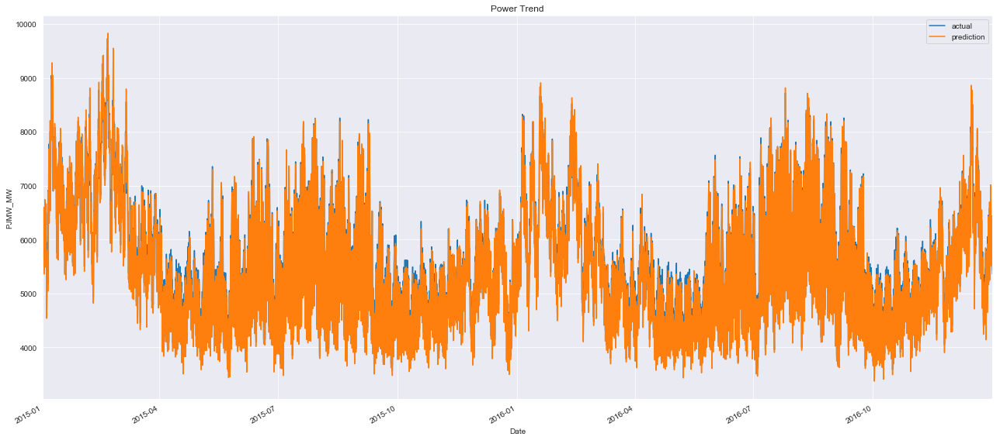

In [47]:
prediction_frame.ix['2015':'2016'].plot()
plt.xlabel('Date')
plt.ylabel('PJMW_MW')
plt.title('Power Trend')
plt.legend()
plt.tight_layout()

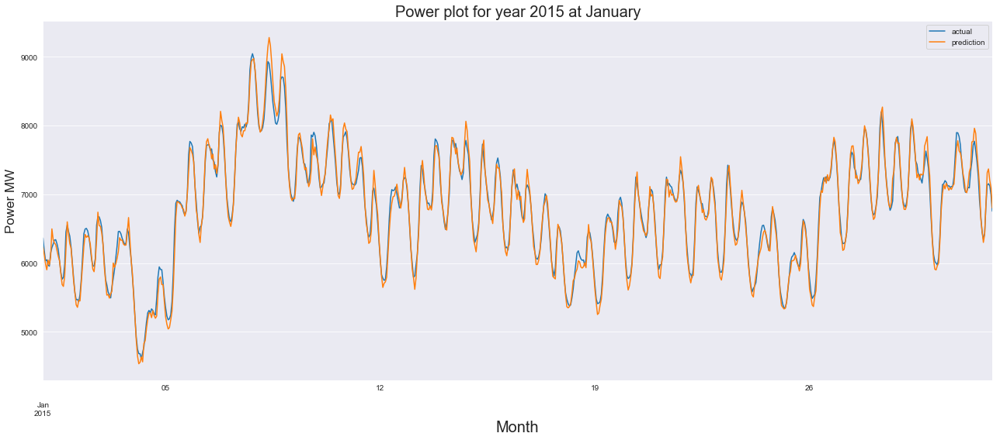

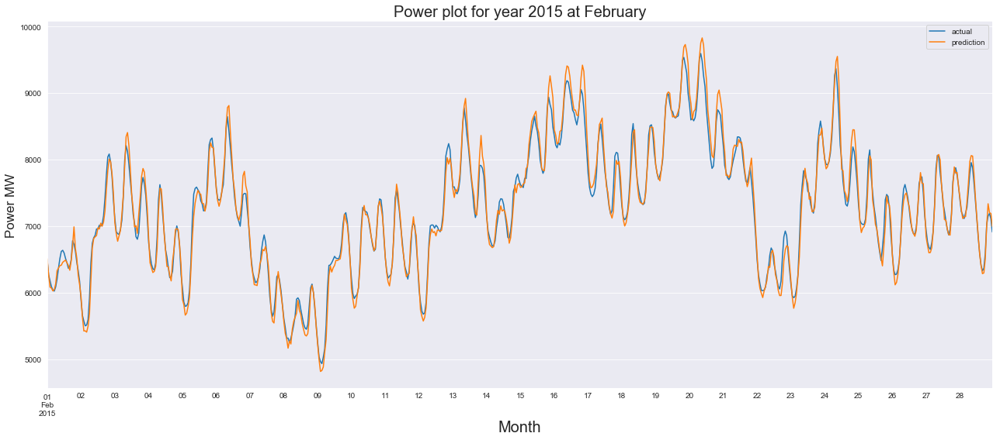

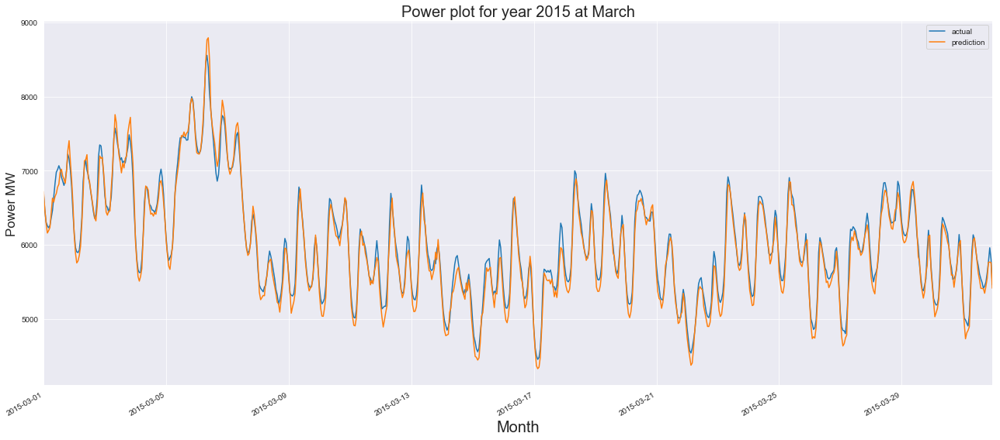

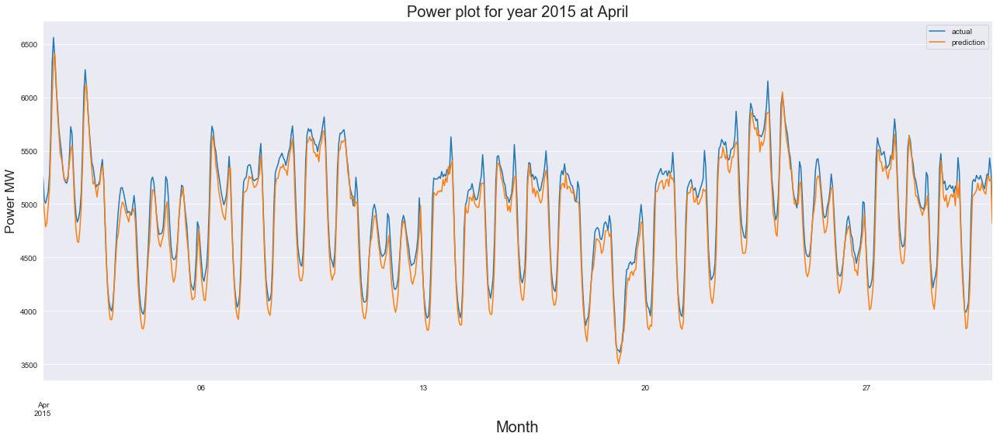

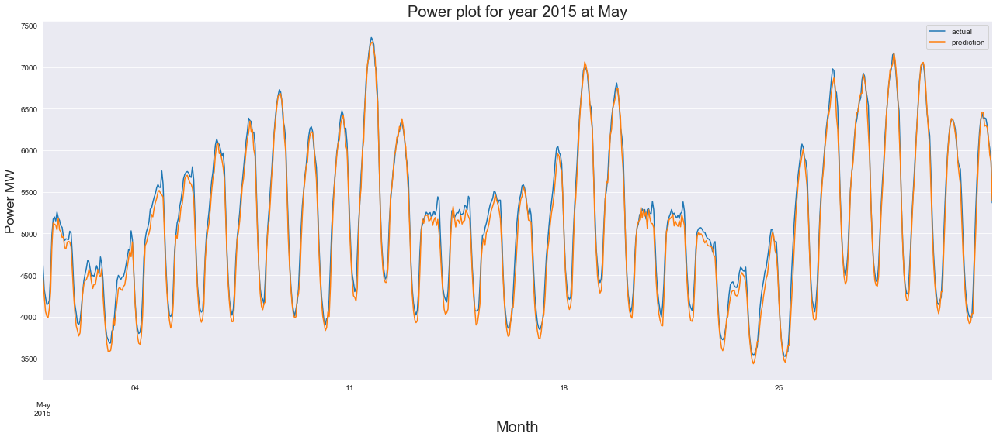

...

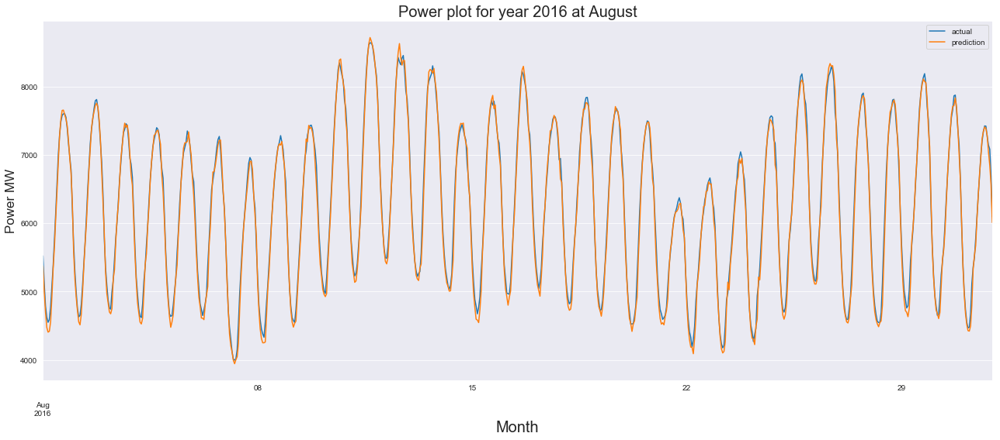

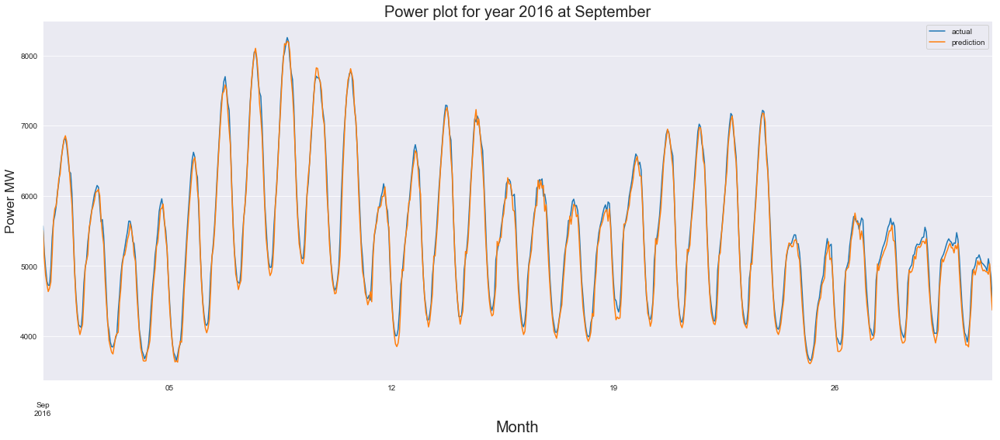

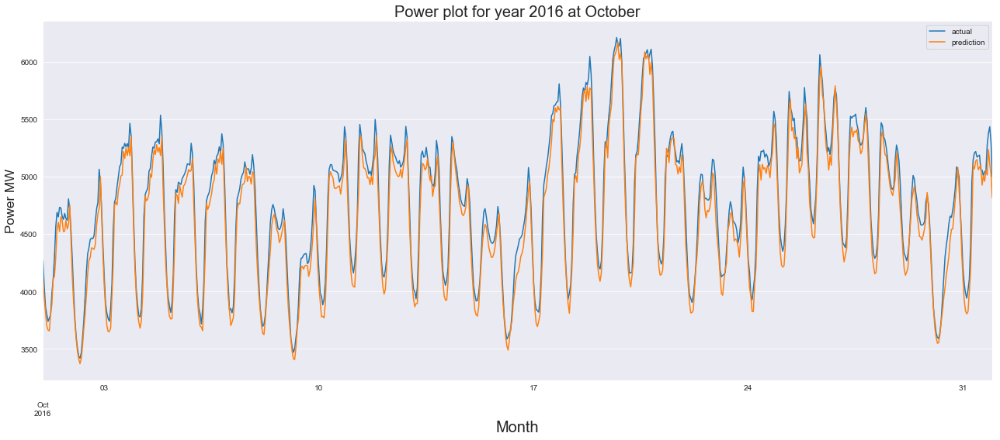

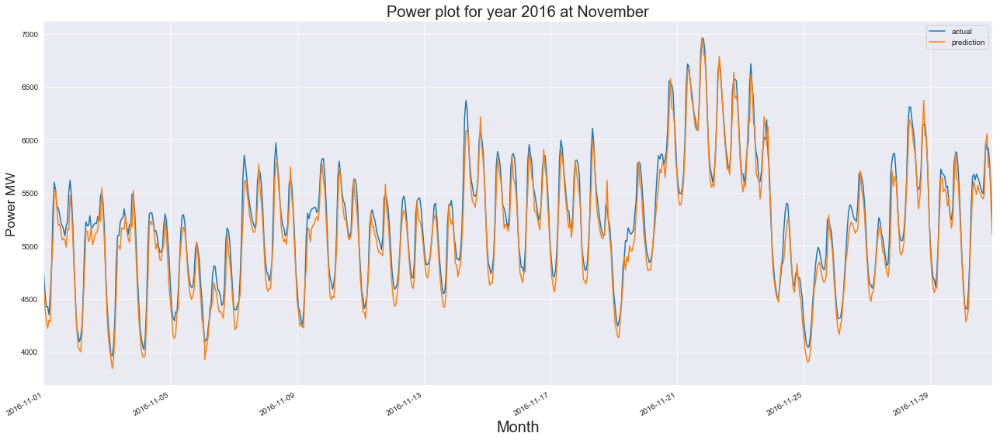

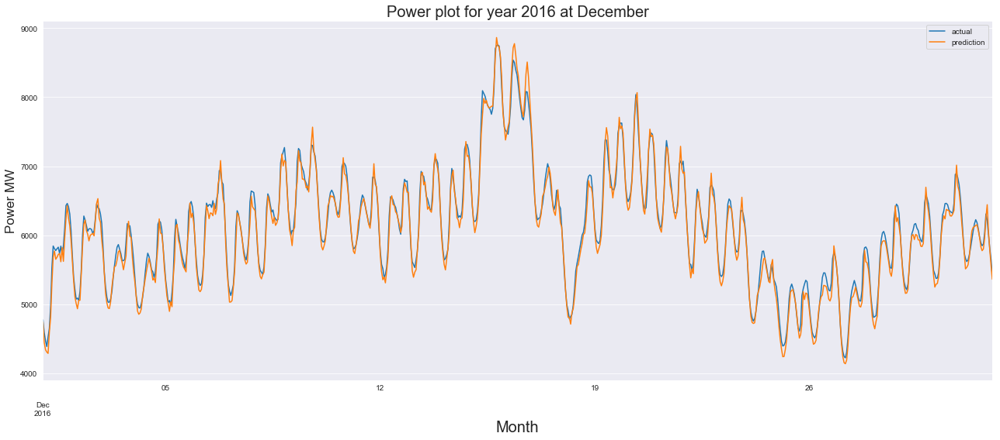

In [51]:
for i in range (15,17):
    for j in range(1,13):
        k=str(j)
        if j<10:
            k='0'+k
        if j==12:
            prediction_frame.ix['20'+str(i)+"-"+k+'-1':'20'+str(i)+'-'+k+'-31'].plot()
            plt.title('Power plot for year '+'20'+str(i)+" at "+months[str(j)], fontsize=20)
            plt.xlabel('Month', fontsize=20)
            plt.ylabel('Power MW', fontsize=17)
            plt.tight_layout()
        else:
            prediction_frame.ix['20'+str(i)+"-"+k+'-1':'20'+str(i)+"-"+str(j)].plot()
            plt.title('Power plot for year '+'20'+str(i)+" at "+months[str(j)], fontsize=20)
            plt.xlabel('Month', fontsize=20)
            plt.ylabel('Power MW', fontsize=17)
            plt.tight_layout()
       

In [58]:
print(f"The Accuracy of this model is estimated to be good if it is within 200 from the Actual value and the Accuracy is:{(len(prediction_frame[abs(prediction_frame['actual']-prediction_frame['prediction'])<=200]))/len(prediction_frame)}")

The Accuracy of this model is estimated to be good if it is within 200 from the Actual value and the Accuracy is:0.9159256725946192
